In [2]:
import pandas as pd

#importing the scaler
from sklearn.preprocessing import StandardScaler

#Splitting data into training and testing set
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score,confusion_matrix, ConfusionMatrixDisplay
from sklearn.metrics import classification_report


# importing libraries
import numpy as np
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.metrics import confusion_matrix, f1_score, precision_score, recall_score

# for visualisation
import matplotlib.pyplot as plt
from sklearn.tree import export_graphviz
from IPython.display import Image  
from subprocess import call


# Scaling modules
from mlxtend.preprocessing import minmax_scaling, standardize

# Plotting modules
import seaborn as sns
import matplotlib.pyplot as plt

In [3]:
titanic_df = pd.read_csv("titanic.csv")
titanic_df.head()

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,1,0,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,7.2500,NaN,S
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.0,1,0,PC 17599,71.2833,C85,C
2,3,1,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,7.9250,NaN,S
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,53.1000,C123,S
4,5,0,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,8.0500,NaN,S


In [4]:
titanic_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 891 entries, 0 to 890
Data columns (total 12 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   PassengerId  891 non-null    int64  
 1   Survived     891 non-null    int64  
 2   Pclass       891 non-null    int64  
 3   Name         891 non-null    object 
 4   Sex          891 non-null    object 
 5   Age          714 non-null    float64
 6   SibSp        891 non-null    int64  
 7   Parch        891 non-null    int64  
 8   Ticket       891 non-null    object 
 9   Fare         891 non-null    float64
 10  Cabin        204 non-null    object 
 11  Embarked     889 non-null    object 
dtypes: float64(2), int64(5), object(5)
memory usage: 83.7+ KB


In [5]:
# You can also drop whichever other columns you'd like here
titanic_df.drop("Cabin", axis=1, inplace=True)

### One-Hot Encoding
One-hot encoding is a technique used to ensure that categorical variables are better represented in the machine. Let's take a look at the "Sex" column

In [6]:
titanic_df["Sex"].unique()

array(['male', 'female'], dtype=object)

Machine Learning classifiers don't know how to handle strings. As a result, you need to convert it into a categorical representation. There are two main ways to go about this:

Label Encoding: Assigning, for example, 0 for "male" and 1 for "female". The problem here is it intrinsically makes one category "larger than" the other category.

One-hot encoding: Assigning, for example, [1, 0] for "male" and [0, 1] for female. In this case, you have an array of size (n_categories,) and you represent a 1 in the correct index, and 0 elsewhere. In Pandas, this would show as extra columns. For example, rather than having a "Sex" column, it would be a "Sex_male" and "Sex_female" column. Then, if the person is male, it would simply show as a 1 in the "Sex_male" column and a 0 in the "Sex_female" column.

There is a nice and easy method that does this in pandas: get_dummies()

In [7]:
titanic_df = pd.get_dummies(titanic_df, prefix="Sex", columns=["Sex"])
titanic_df.head()

,PassengerId,Survived,Pclass,Name,Age,SibSp,Parch,Ticket,Fare,Embarked,Sex_female,Sex_male
0,1,0,3,"Braund, Mr. Owen Harris",22.0,1,0,A/5 21171,7.2500,S,False,True
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",38.0,1,0,PC 17599,71.2833,C,True,False
2,3,1,3,"Heikkinen, Miss. Laina",26.0,0,0,STON/O2. 3101282,7.9250,S,True,False
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",35.0,1,0,113803,53.1000,S,True,False
4,5,0,3,"Allen, Mr. William Henry",35.0,0,0,373450,8.0500,S,False,True


Now, we do the same to the "Embarked" column.

In [8]:
titanic_df = pd.get_dummies(titanic_df, prefix="Embarked", columns=["Embarked"])
titanic_df.head()

,PassengerId,Survived,Pclass,Name,Age,SibSp,Parch,Ticket,Fare,Sex_female,Sex_male,Embarked_C,Embarked_Q,Embarked_S
0,1,0,3,"Braund, Mr. Owen Harris",22.0,1,0,A/5 21171,7.2500,False,True,False,False,True
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",38.0,1,0,PC 17599,71.2833,True,False,True,False,False
2,3,1,3,"Heikkinen, Miss. Laina",26.0,0,0,STON/O2. 3101282,7.9250,True,False,False,False,True
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",35.0,1,0,113803,53.1000,True,False,False,False,True
4,5,0,3,"Allen, Mr. William Henry",35.0,0,0,373450,8.0500,False,True,False,False,True


# Practical Task

### Create a decision tree that can predict the survival of passengers on the Titanic. Make sure not to impose any restrictions on the depth of the tree

In [9]:
# view current Columns
titanic_df.columns


Index(['PassengerId', 'Survived', 'Pclass', 'Name', 'Age', 'SibSp', 'Parch',
       'Ticket', 'Fare', 'Sex_female', 'Sex_male', 'Embarked_C', 'Embarked_Q',
       'Embarked_S'],
      dtype='object')

In [10]:
# creating new dataframe with only required  columns
del_column = ['PassengerId','Name','Ticket', 'Fare', 'Embarked_C', 'Embarked_Q', 'Embarked_S']
df = titanic_df.drop(del_column, axis='columns')
df.columns

Index(['Survived', 'Pclass', 'Age', 'SibSp', 'Parch', 'Sex_female',
       'Sex_male'],
      dtype='object')

### Cleanup

In [11]:
#check null values
df.isnull().sum()

Survived        0
Pclass          0
Age           177
SibSp           0
Parch           0
Sex_female      0
Sex_male        0
dtype: int64

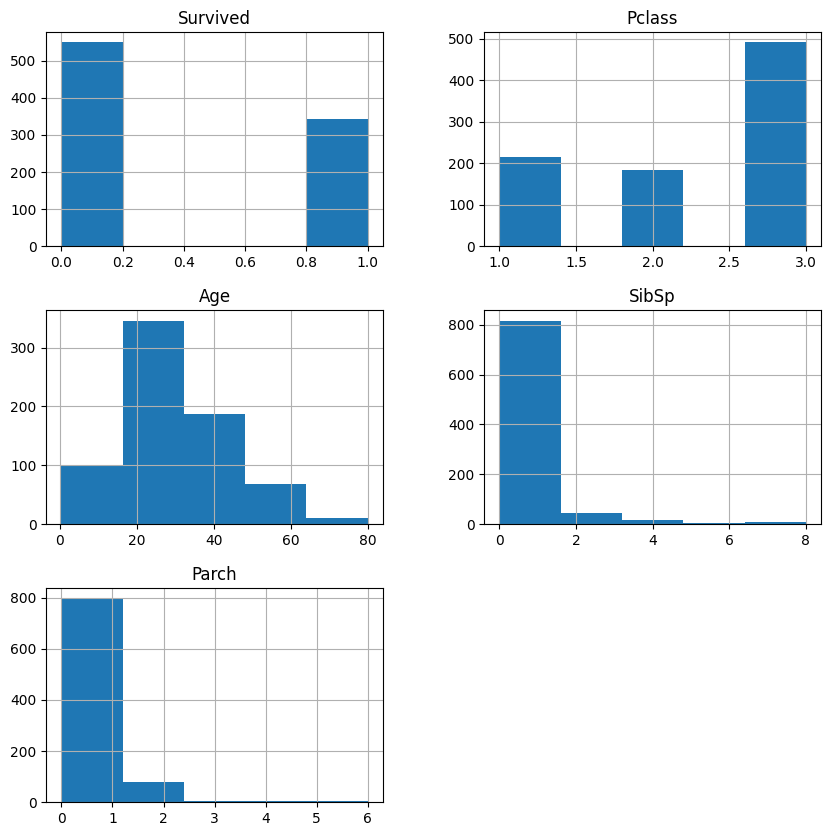



 Plotting the distribution of the data<seaborn.axisgrid.PairGrid object at 0x0000016AD3FCCFB0>




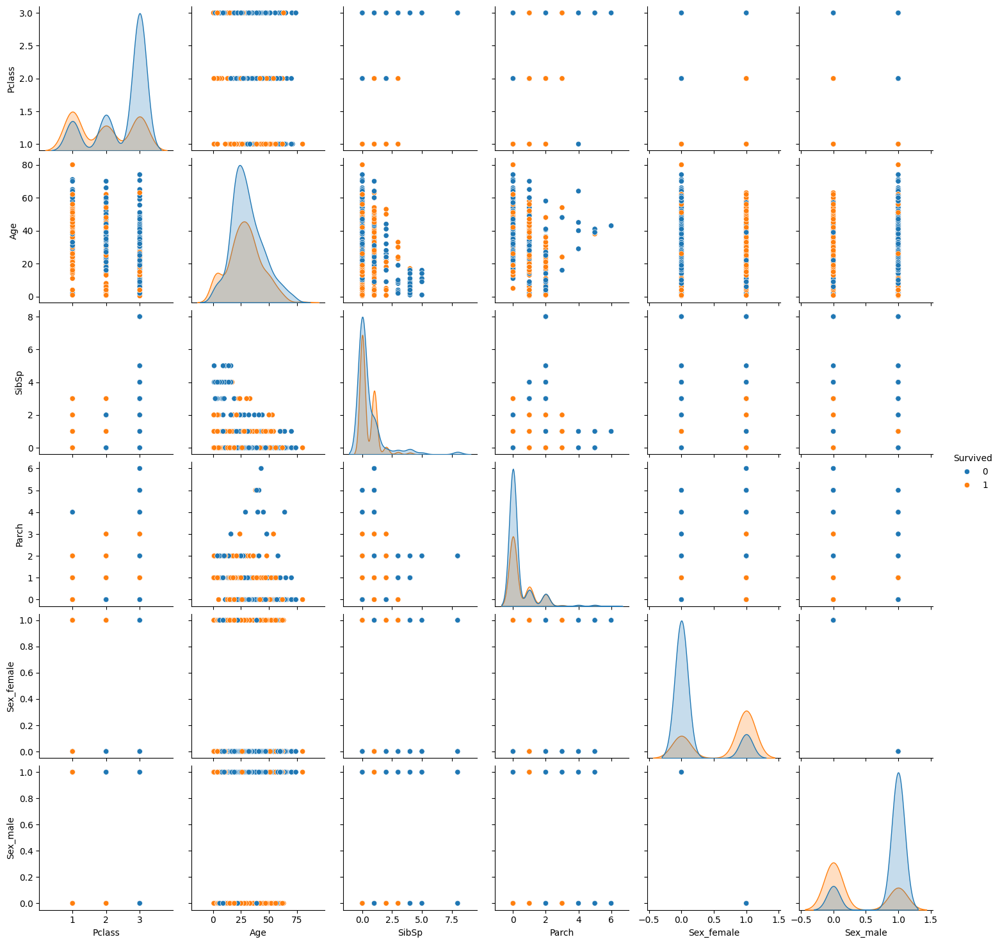

In [12]:
df.hist(bins=5,figsize=(10,10))
plt.show()

# Plot the distribution of the data
print(f"\n\n Plotting the distribution of the data{sns.pairplot(data=df, hue='Survived')}\n\n" )

##### Looking at the data, its better to use mean to fill in Age missing values as its not heavily skewed to one side

In [13]:
#Filling null values in the AGE column with the mean of the column values
df = df.fillna(df["Age"].mean())

#Confirming of there are still null values
df.isnull().sum()

Survived      0
Pclass        0
Age           0
SibSp         0
Parch         0
Sex_female    0
Sex_male      0
dtype: int64

## Training

In [14]:
X = df.drop('Survived', axis=1)
y = titanic_df.Survived

#random state
random_seed = 42
# Split the training set further into training and development sets
X_train_full, X_test, y_train_full, y_test = train_test_split(X, y, test_size=0.15, random_state=random_seed)

# Split the training set further into training and development sets
X_train, X_dev, y_train, y_dev = train_test_split(X_train_full, y_train_full, test_size=0.15, random_state=random_seed)


#### Train a decision tree and make a plot of it.

In [15]:
# training a model without pruning
unpruned = DecisionTreeClassifier(random_state=random_seed)
unpruned.fit(X_train, y_train)
y_dev_pred = unpruned.predict(X_dev)
y_train_pred = unpruned.predict(X_train)
y_test_pred = unpruned.predict(X_test)

#Model Accuracy and Confusion Matrix, how often is the classifier correct
print(f'Training Accuracy: {accuracy_score(y_train, y_train_pred)}')
print(f'Testing Accuracy without pruning: {accuracy_score(y_test, y_test_pred)}')
print(f'Development Accuracy without pruning: {accuracy_score(y_dev, y_dev_pred)}')
print("At depth:", unpruned.tree_.max_depth)

Training Accuracy: 0.9206842923794712
Testing Accuracy without pruning: 0.7910447761194029
Development Accuracy without pruning: 0.7631578947368421
At depth: 18


#### Checking how often the classifier predict is correct

Training Accuracy: 0.9206842923794712
Testing Accuracy: 0.7910447761194029
Dev Accuracy: 0.7631578947368421


Text(0.5, 1.0, 'Dev Confusion Matrix')

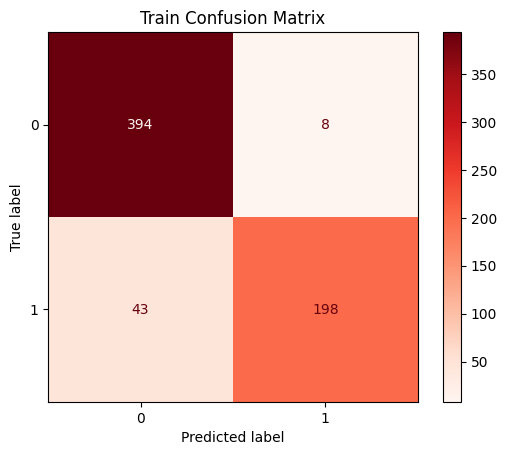

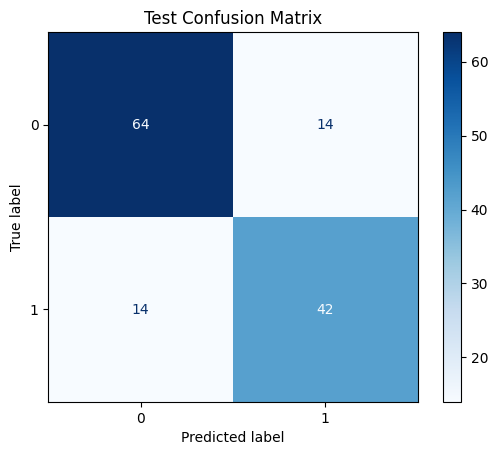

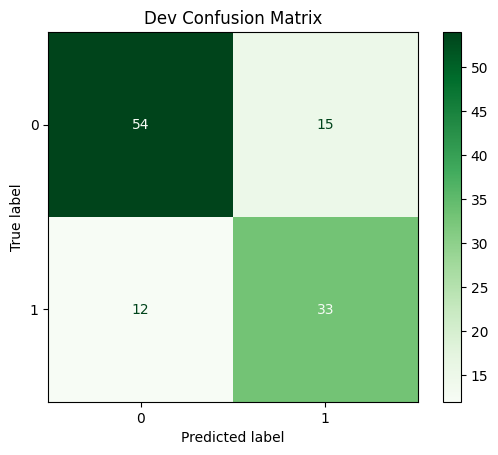

In [16]:
#Model Accuracy and Confusion Matrix, how often is the classifier correct
print(f'Training Accuracy: {accuracy_score(y_train, y_train_pred)}')
print(f'Testing Accuracy: {accuracy_score(y_test, y_test_pred)}')
print(f'Dev Accuracy: {accuracy_score(y_dev, y_dev_pred)}')

cm = confusion_matrix(y_train, y_train_pred, labels=unpruned.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=unpruned.classes_)
disp.plot(cmap='Reds')
plt.title('Train Confusion Matrix')

cm = confusion_matrix(y_test, y_test_pred, labels=unpruned.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=unpruned.classes_)
disp.plot(cmap='Blues')
plt.title('Test Confusion Matrix')

cm = confusion_matrix(y_dev, y_dev_pred, labels=unpruned.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=unpruned.classes_)
disp.plot(cmap='Greens')
plt.title('Dev Confusion Matrix')

#### Unpruned Decision tree

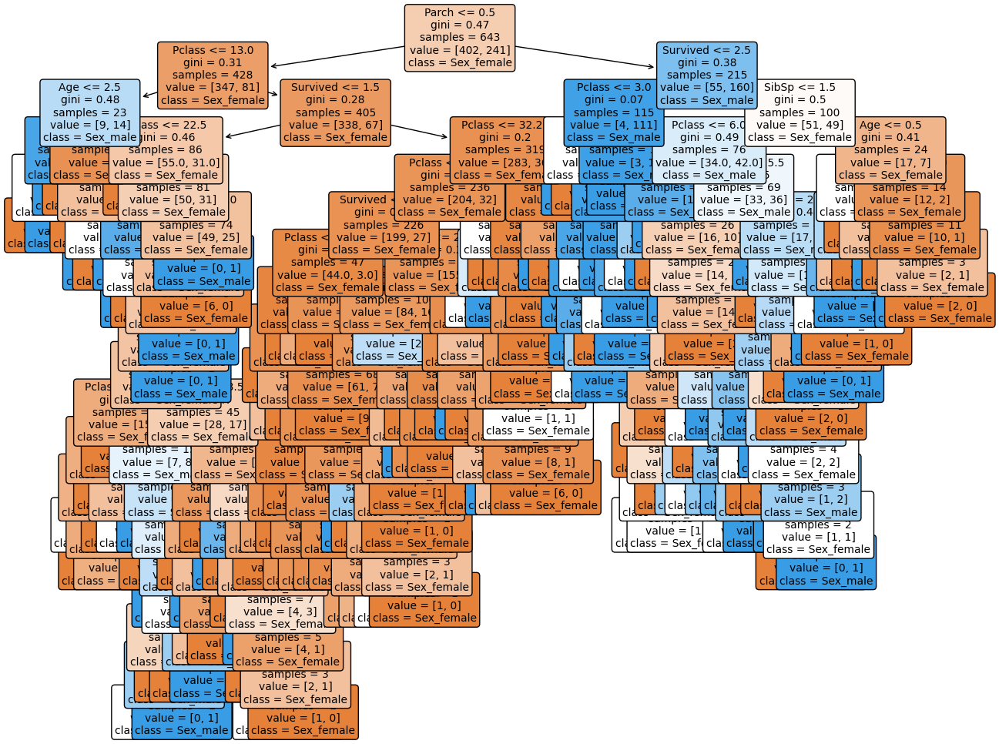

In [17]:
#Plot of the decision tree thats not pruned
fig = plt.figure(figsize=(15,12))
classes = ['Sex_female', 'Sex_male']
tree.plot_tree(unpruned,feature_names = df.columns,class_names=classes, rounded = True, proportion = False, precision = 2, filled = True, fontsize=10) #display tree
fig.savefig('unpruned_tree.png')

## Compute your model’s accuracy on the development set.

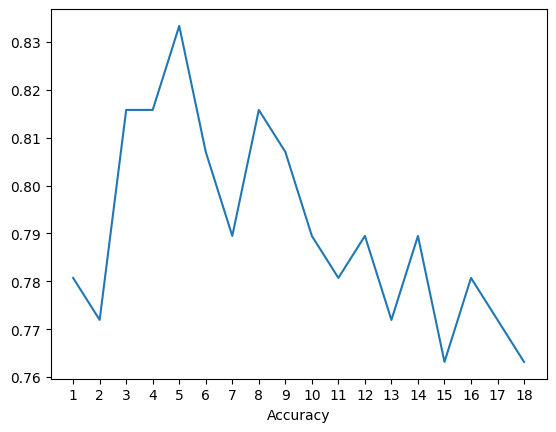

In [18]:
# looking at effect of pruning   
pruned_depths = range(1,unpruned.tree_.max_depth+1)

pruned_scores = [] 
for d in pruned_depths:
  clf = DecisionTreeClassifier(max_depth=d, random_state=random_seed)
  clf.fit(X_train, y_train)
  score = clf.score(X_dev, y_dev)
  pruned_scores.append(score)

fig, ax = plt.subplots()
ax.plot(pruned_depths, pruned_scores)
plt.xlabel("Max_depth values")
plt.xlabel("Accuracy")
ax.xaxis.set_ticks(pruned_depths)
plt.show()

In [19]:
# Optimal depth value is 5 in this case, confirming based on performance below

# fitting the chosen tree
best_depth = pruned_depths[np.argmax(pruned_scores)]
print('Best performance reached at depth of:', best_depth)

pruned = DecisionTreeClassifier(criterion="entropy", max_depth=best_depth,random_state=random_seed,min_samples_leaf=2)
pruned.fit(X_train, y_train)

#Predict the response for dev dataset
y_test_dev = pruned.predict(X_dev)

# Model Accuracy, how often is the classifier correct
print("Dev Accuracy:",accuracy_score(y_dev, y_test_dev))


Best performance reached at depth of: 5
Dev Accuracy: 0.8333333333333334


### Dev Accuracy: 76% to 83% after pruning

#### Confusion Matrix for pruned tree

Dev Accuracy: 0.8333333333333334


Text(0.5, 1.0, 'Dev Confusion Matrix')

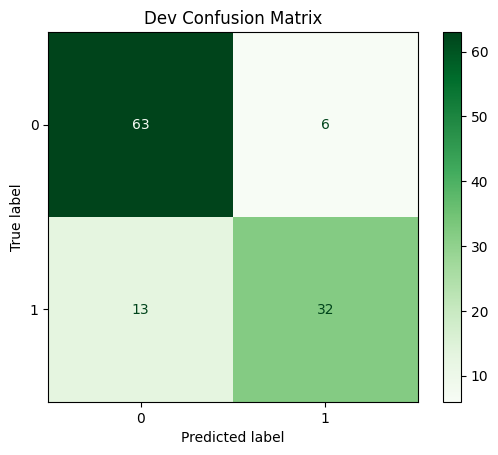

In [20]:
#Model Accuracy and Confusion Matrix, how often is the classifier correct
print(f'Dev Accuracy: {accuracy_score(y_dev, y_test_dev)}')

# cm = confusion_matrix(y_train, y_train_pred, labels=pruned.classes_)
# disp = ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=pruned.classes_)
# disp.plot(cmap='Reds')
# plt.title('Train Confusion Matrix')

# cm = confusion_matrix(y_test, y_test_pred, labels=pruned.classes_)
# disp = ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=pruned.classes_)
# disp.plot(cmap='Blues')
# plt.title('Test Confusion Matrix')

cm = confusion_matrix(y_dev, y_test_dev, labels=pruned.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=pruned.classes_)
disp.plot(cmap='Greens')
plt.title('Dev Confusion Matrix')

#### Pruned decision tree

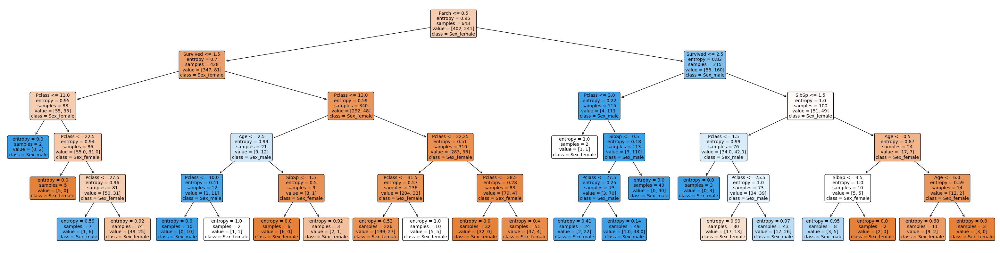

In [21]:
#Plot of the decision tree thats pruned
fig = plt.figure(figsize=(40,10))
classes = ['Sex_female', 'Sex_male']
tree.plot_tree(pruned,feature_names = df.columns,class_names=classes, rounded = True, proportion = False, precision = 2, filled = True, fontsize=10) #display tree
fig.savefig('pruned_tree.png')

# Try building your model with different values of max_depth (2–10). At each step, create a plot of your tree and store the accuracies on both the training and development data.

Performance for Training model is at depth of: 2 has Accuracy of: 0.7916018662519441
Performance for Dev model is at depth of: 2 has Accuracy of: 0.7807017543859649
Performance for Training model is at depth of: 4 has Accuracy of: 0.8227060653188181
Performance for Dev model is at depth of: 4 has Accuracy of: 0.8157894736842105
Performance for Training model is at depth of: 6 has Accuracy of: 0.8460342146189735
Performance for Dev model is at depth of: 6 has Accuracy of: 0.8333333333333334
Performance for Training model is at depth of: 8 has Accuracy of: 0.8615863141524106
Performance for Dev model is at depth of: 8 has Accuracy of: 0.8245614035087719
Performance for Training model is at depth of: 10 has Accuracy of: 0.8724727838258165
Performance for Dev model is at depth of: 10 has Accuracy of: 0.8245614035087719


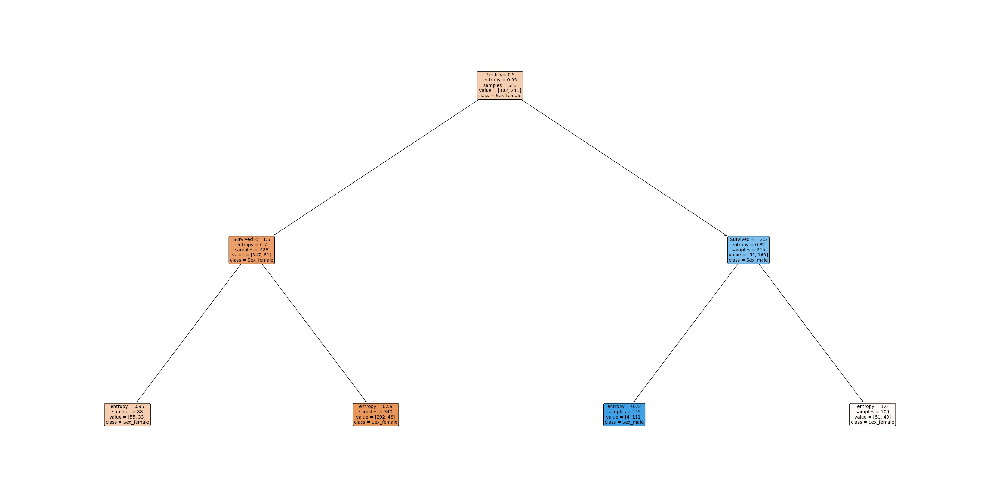

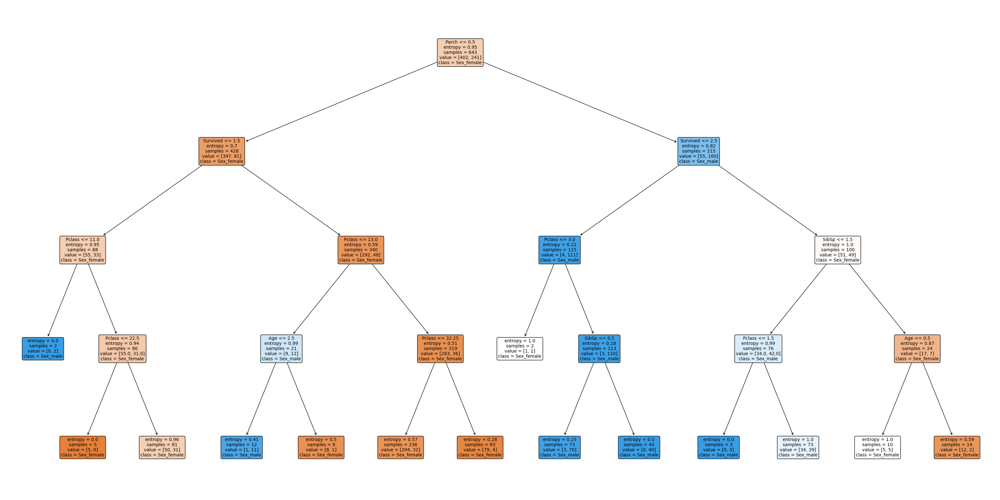

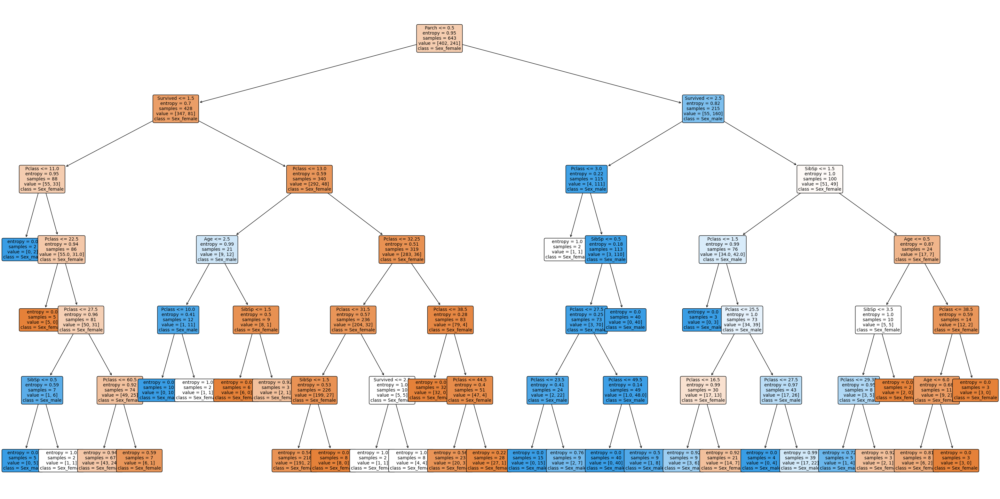

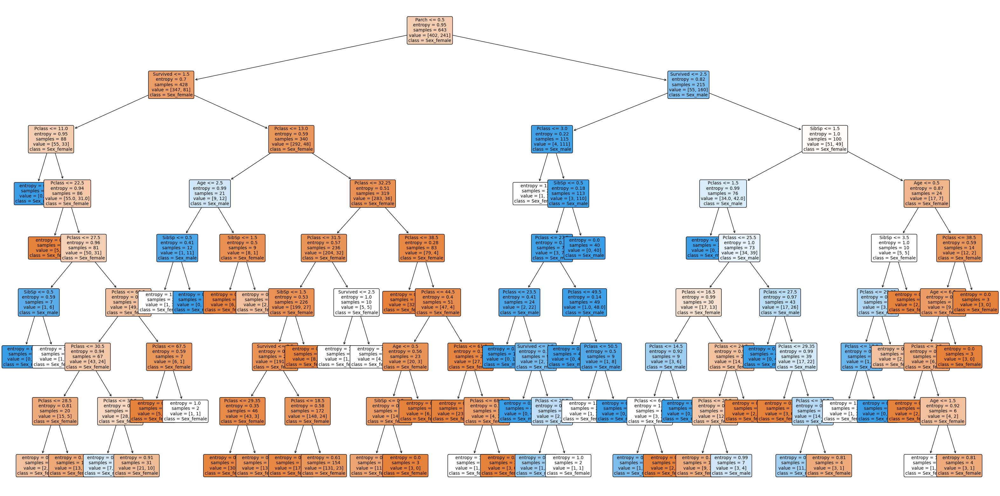

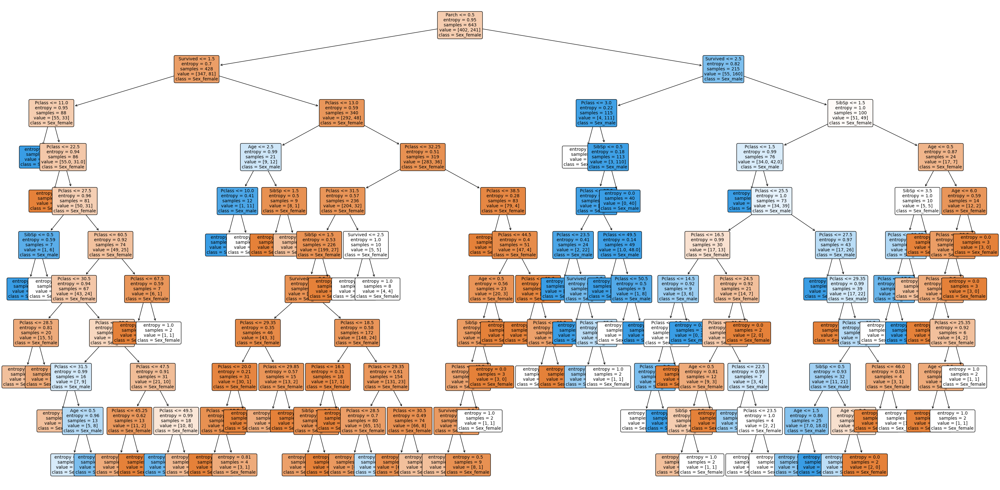

In [22]:
# going to create accuracy model of 5 values(2,4,6,8,10)

# Model based on max depth of 2-10 and plot a tree
classes = ['Sex_female', 'Sex_male']
depth_array = [2,4,6,8,10]
acc_train_ary = []
acc_dev_ary = []

#Loop to generate the tree and accuracies
for x in depth_array:
    #fitting tree
    pruned_sample = DecisionTreeClassifier(criterion="entropy", max_depth=x,random_state=random_seed,min_samples_leaf=2)
    pruned_sample.fit(X_train, y_train)
    y_test_train = pruned_sample.predict(X_train)
    y_test_dev = pruned_sample.predict(X_dev)
    #Calculatibg Accarucy score and storing in arrays 
    acc_sc_train= accuracy_score(y_train, y_test_train)
    acc_train_ary.append(acc_sc_train)
    acc_sc_dev= accuracy_score(y_dev, y_test_dev)
    acc_dev_ary.append(acc_sc_dev)
    #Tree Plot
    fig = plt.figure(figsize=(40,20))
    tree.plot_tree(pruned_sample,feature_names = df.columns,class_names=classes, rounded = True, proportion = False, precision = 2, filled = True, fontsize=10) #display tree
    #Printing Accuracy for both train and Development at the depths from depth_array
    print(f'Performance for Training model is at depth of: {x} has Accuracy of: {acc_sc_train}')
    print(f'Performance for Dev model is at depth of: {x} has Accuracy of: {acc_sc_dev}')

#print(acc_dev_ary)


Text(0.5, 1.0, 'Test Confusion Matrix')

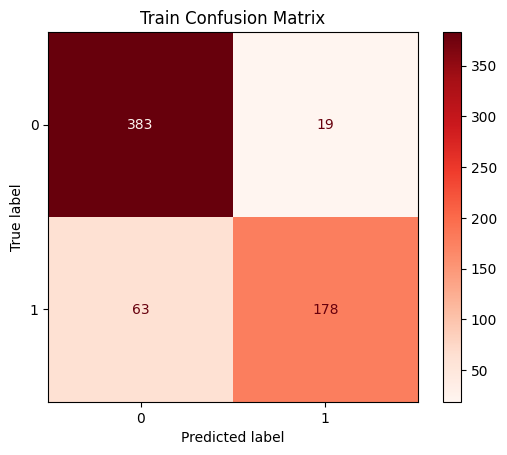

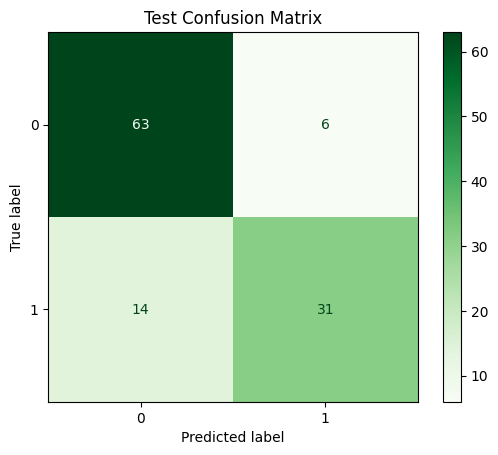

In [23]:
# confusing matrix
cm = confusion_matrix(y_train, y_test_train, labels=pruned_sample.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=pruned_sample.classes_)
disp.plot(cmap='Reds')
plt.title('Train Confusion Matrix')

cm = confusion_matrix(y_dev, y_test_dev, labels=pruned_sample.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=pruned_sample.classes_)
disp.plot(cmap='Greens')
plt.title('Test Confusion Matrix')

## Plot a line of your training accuracies and another of your development accuracies in the same graph. Write down what shape the lines have and what this shape means.

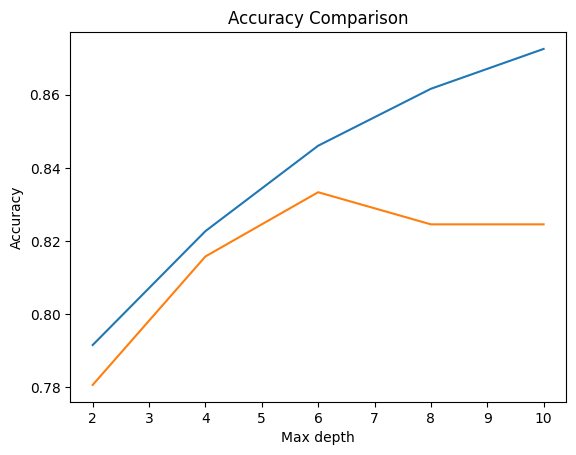

In [24]:
#Plot for Accuracy comparison between Training and development training
plt.title("Accuracy Comparison")
plt.xlabel("Max depth")
plt.ylabel("Accuracy")
plt.plot(depth_array, acc_train_ary, label="Training") # blue
plt.plot(depth_array, acc_dev_ary, label="Development") # orange

#### Looking at the above graph we can see the the accuracy dropping between 5 and 6 so the ideal canditate for maxt dept seem to be a good choice of 5 as was predicted innitially
#### Before 5 it would seem to be an underfitting model and more than 6 would make it over fitting. so the sweet spot is between 5-6 debth

# Report the accuracy of your final model on the test data

In [25]:
# Optimal depth value is 5 in this case, confirming based on performance below

# fitting the chosen tree
pruned_fin = DecisionTreeClassifier(criterion="entropy", max_depth=best_depth,random_state=random_seed,min_samples_leaf=2)
pruned_fin.fit(X_train, y_train)

#Predict the response for test dataset
y_test_test = pruned_fin.predict(X_test)


# Model Accuracy, how often is the classifier correct
print("Testing Accuracy:",accuracy_score(y_test, y_test_test))



Testing Accuracy: 0.7686567164179104


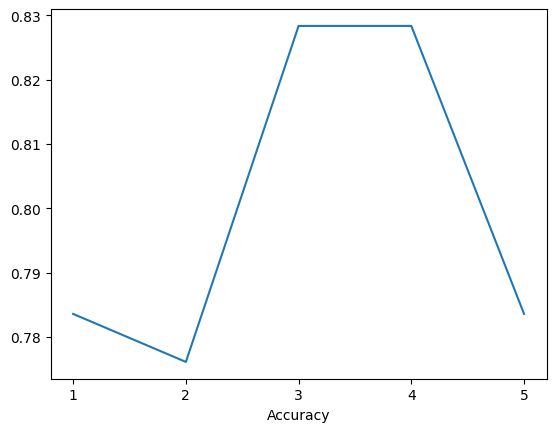

Best performance reached at depth of: 3


In [26]:
# looking at effect of pruning predictions  
pruned_depths = range(1,pruned_fin.tree_.max_depth+1)

pruned_scores = [] 
for d in pruned_depths:
  clf = DecisionTreeClassifier(max_depth=d, random_state=random_seed)
  clf.fit(X_train, y_train)
  score = clf.score(X_test, y_test)
  pruned_scores.append(score)

fig, ax = plt.subplots()
ax.plot(pruned_depths, pruned_scores)
plt.xlabel("Max_depth values")
plt.xlabel("Accuracy")
ax.xaxis.set_ticks(pruned_depths)
plt.show()


# Optimal depth value is 3-4 in this case, confirming based on performance below

# fitting the chosen tree
best_depth = pruned_depths[np.argmax(pruned_scores)]
print('Best performance reached at depth of:', best_depth)

Performance for Testing model is at depth of: 2 has Accuracy of: 0.7686567164179104
Performance for Testing model is at depth of: 4 has Accuracy of: 0.8283582089552238
Performance for Testing model is at depth of: 6 has Accuracy of: 0.8059701492537313
Performance for Testing model is at depth of: 8 has Accuracy of: 0.8208955223880597
Performance for Testing model is at depth of: 10 has Accuracy of: 0.8208955223880597


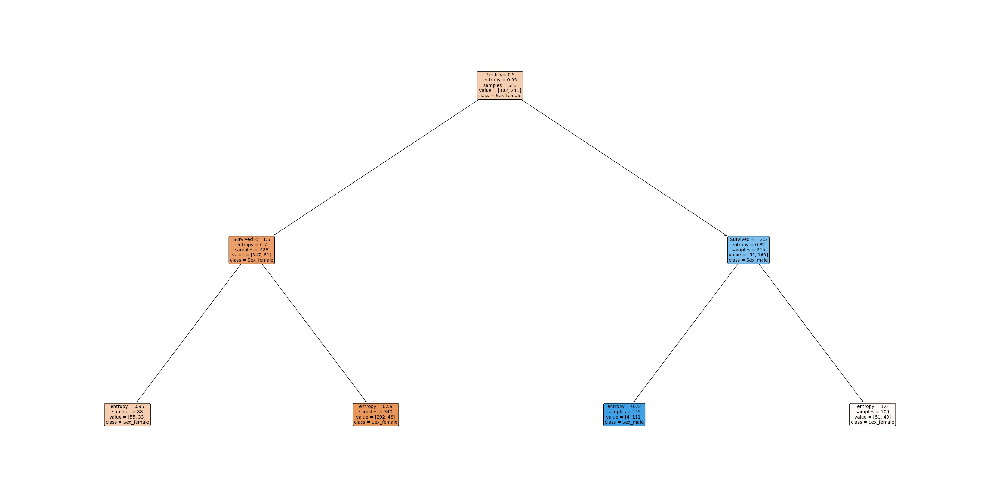

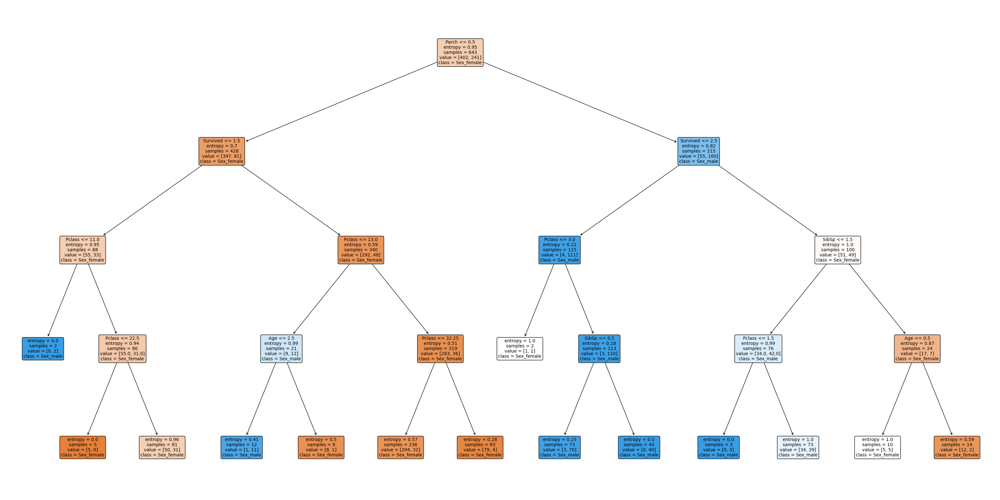

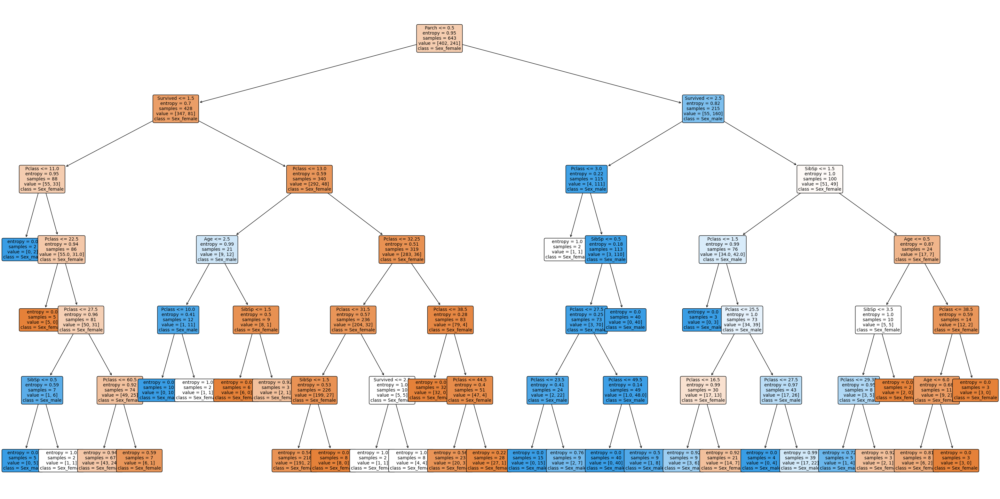

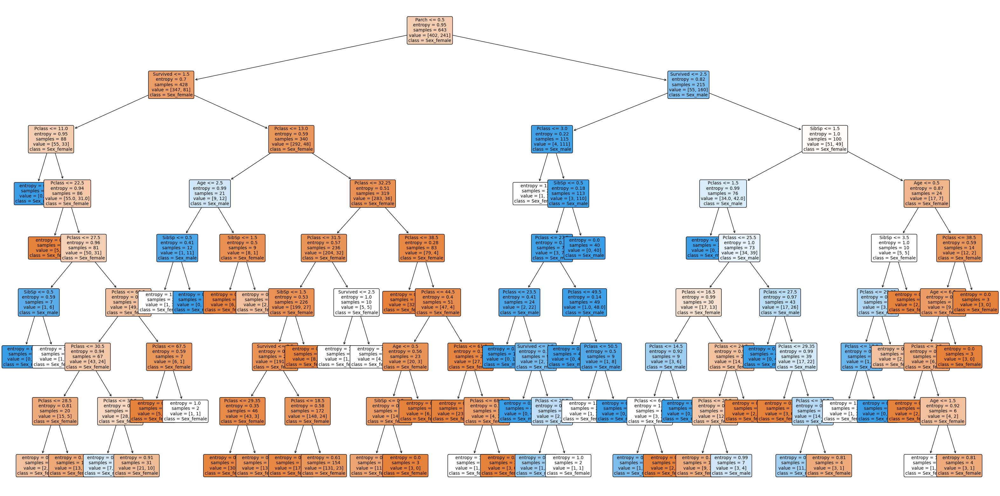

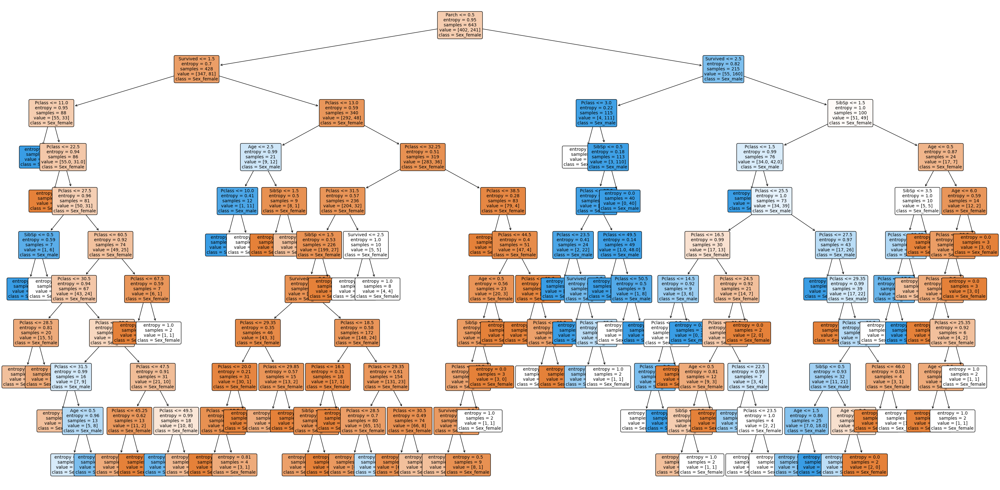

In [27]:
# Model based on max depth of 2-10 and plot a tree
acc_test_ary = []
#Loop to generate the tree and accuracies
for x in depth_array:
    #fitting tree
    pruned_sample = DecisionTreeClassifier(criterion="entropy", max_depth=x,random_state=random_seed,min_samples_leaf=2)
    pruned_sample.fit(X_train, y_train)
    y_test_test = pruned_sample.predict(X_test)
    #Calculatibg Accarucy score and storing in arrays 
    acc_sc_test= accuracy_score(y_test, y_test_test)
    acc_test_ary.append(acc_sc_test)
    #Tree Plot
    fig = plt.figure(figsize=(40,20))
    tree.plot_tree(pruned_sample,feature_names = df.columns,class_names=classes, rounded = True, proportion = False, precision = 2, filled = True, fontsize=10) #display tree
    #Printing Accuracy for both train and Development at the depths from depth_array
    print(f'Performance for Testing model is at depth of: {x} has Accuracy of: {acc_sc_test}')

Text(0.5, 1.0, 'Train Confusion Matrix')

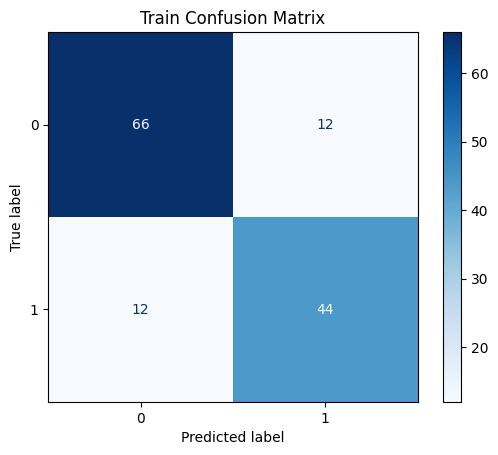

In [28]:
# confusing matrix
cm = confusion_matrix(y_test, y_test_test, labels=pruned_fin.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=pruned_fin.classes_)
disp.plot(cmap='Blues')
plt.title('Train Confusion Matrix')

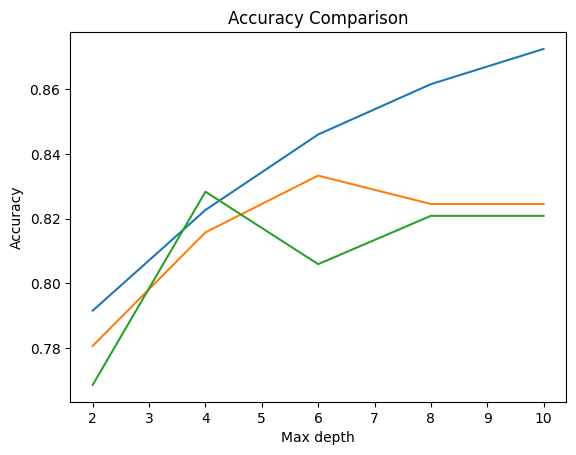

In [29]:
#comparing the Testing with the other 2 models for comparison
#Plot for Accuracy comparison between Training and development training
plt.title("Accuracy Comparison")
plt.xlabel("Max depth")
plt.ylabel("Accuracy")
plt.plot(depth_array, acc_train_ary, label="Training") # blue
plt.plot(depth_array, acc_dev_ary, label="Development") # orange
plt.plot(depth_array, acc_test_ary, label="Testing") # green

### Based on the predictions it looks like the sweet spot for the test data(Green) is at the depth of 4 and below that is underfit, above that is overfit

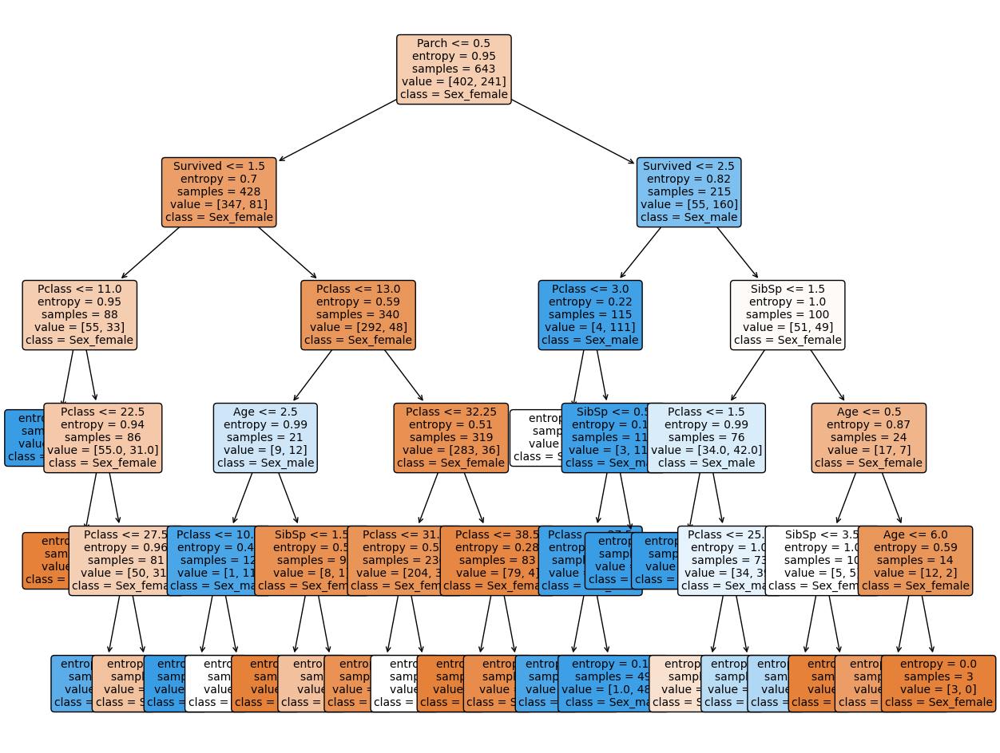

In [30]:
 #Tree Plot
fig = plt.figure(figsize=(15,12))
classes = ['Sex_female', 'Sex_male']
tree.plot_tree(pruned_fin,feature_names = df.columns,class_names=classes, rounded = True, proportion = False, precision = 2, filled = True, fontsize=10) #display tree
fig.savefig('final_tree.png')

# ------Supervised Learnimg Random Forest Practical Task------

## Create a bagged, random forest, and boosted tree for the Titanic data set in the same way that you created a regular classification tree

In [31]:
# Create Random Forest Classifie
rf = RandomForestClassifier(n_estimators=100, random_state=random_seed)
ensemble = BaggingClassifier(estimator=pruned_fin, n_estimators=100, random_state=random_seed)

# Train the RF classifier
ensemble.fit(X_train,y_train)
rf.fit(X_train,y_train)

RandomForestClassifier(random_state=42)

## From the random forest model, determine which of the features is the one that contributes the most to predicting whether a passenger survives or not.

In [ ]:
#Finding the important features using the built-in Gini importance
importances = rf.feature_importances_
feature_imp_df = pd.DataFrame({'Feature': X.columns, 'Gini Importance': importances}).sort_values('Gini Importance', ascending=False)
# Creating a seaborn bar plot
sns.barplot(x=feature_imp_df['Gini Importance'],y=feature_imp_df['Feature'],data=feature_imp_df)
plt.title("Gini Feature Importance")
plt.xlabel("Gini importance score")
plt.ylabel("Features")

#### Looking at the data above it looks like age has the highest importance score

## Pick one of these methods, and tune the parameters n_estimators and max_depth.

In [ ]:
# Lets confirm which model has the highest accuracy and use that method to tune the parameters
# Setup prediction for accuracy
y_test_pred_ensemble = ensemble.predict(X_test)
y_test_pred_rf = rf.predict(X_test)

print(f"Testing Accuracy Base model:{accuracy_score(y_test, y_test_test)}")
print(f'Testing Accuracy for ensemble Bagging model: {accuracy_score(y_test, y_test_pred_ensemble)}')
print(f'Testing Accuracy for Random Forest model: {accuracy_score(y_test, y_test_pred_rf)}')

#### Looks like the Random Forest model has the highest accuracy

In [ ]:
# Hyperparameter tuning using GridSearchCV and fit the data.

params = {
    'max_depth': [2,3,5,10,20],
    'n_estimators': [10,30,50,100,200]
}

# Instantiate the grid search model
grid_search = GridSearchCV(estimator=rf, param_grid=params , cv=4,n_jobs=-1, verbose=1, scoring="accuracy")
grid_search.fit(X_train, y_train)

#Check best score hyperparameters
print(grid_search.best_score_)
rf_best = grid_search.best_estimator_
rf_best

## Report the accuracy of all models and report which model performed the best, including the values for n_estimators and max_depth that the best model had.

In [ ]:
#Accuracy for existing models
print(f"Testing Accuracy:{accuracy_score(y_test, y_test_test)}")
print(f'Testing Accuracy for ensemble Bagging model: {accuracy_score(y_test, y_test_pred_ensemble)}')
print(f'Testing Accuracy for Random Forest model: {accuracy_score(y_test, y_test_pred_rf)}')


In [ ]:
##### Bagging Classifier, with hyperparameters since this model performed the best
rf_hp = RandomForestClassifier(max_depth=5 , n_estimators=100, random_state=random_seed)
rf_hp.fit(X_train,y_train)
y_test_rf_hp = rf_hp.predict(X_test)

print(f'Testing Accuracy for Random Forest model with hyperparameters: {accuracy_score(y_test, y_test_rf_hp)}')

#### Conclusion it seems that the random forest with default values seem to be performing well at 0.8432835820895522 as compared with finetuned random forest at 0.8283582089552238. which leads me to think that some models might not really need fine tuning but its a good pratice to confirm the data and use this feature to help get the best possible results and accuracy